In [17]:
from mxnet import ndarray as nd

In [18]:
nd.zeros((3,4))


[[0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]]
<NDArray 3x4 @cpu(0)>

In [19]:
x=nd.ones((3,4))
x


[[1. 1. 1. 1.]
 [1. 1. 1. 1.]
 [1. 1. 1. 1.]]
<NDArray 3x4 @cpu(0)>

In [20]:
nd.array([[1,2],[2,3]])


[[1. 2.]
 [2. 3.]]
<NDArray 2x2 @cpu(0)>

In [21]:
y=nd.random_normal(0,1,shape=(3,4))
y


[[-0.44015616 -0.7517      0.9865001   0.12359927]
 [ 0.277061   -0.10323901 -0.91978145 -0.90252906]
 [-1.7197605   0.2696242  -0.2026513   1.4127252 ]]
<NDArray 3x4 @cpu(0)>

这里是你可以生成一个元素符合均值为0方差为1的正态分布的3*4的矩阵

In [22]:
y.shape

(3, 4)

In [23]:
y.size

12

In [24]:
x+y


[[ 0.55984384  0.24830002  1.9865      1.1235993 ]
 [ 1.277061    0.896761    0.08021855  0.09747094]
 [-0.71976054  1.2696242   0.7973487   2.4127252 ]]
<NDArray 3x4 @cpu(0)>

In [25]:
x*y


[[-0.44015616 -0.7517      0.9865001   0.12359927]
 [ 0.277061   -0.10323901 -0.91978145 -0.90252906]
 [-1.7197605   0.2696242  -0.2026513   1.4127252 ]]
<NDArray 3x4 @cpu(0)>

In [26]:
nd.exp(y)


[[0.64393586 0.47156423 2.6818318  1.1315624 ]
 [1.3192468  0.9019114  0.39860615 0.40554273]
 [0.17910904 1.3094723  0.81656295 4.107133  ]]
<NDArray 3x4 @cpu(0)>

In [27]:
nd.dot(x,y.T)


[[-0.08175679 -1.6484885  -0.24006236]
 [-0.08175679 -1.6484885  -0.24006236]
 [-0.08175679 -1.6484885  -0.24006236]]
<NDArray 3x3 @cpu(0)>

In [28]:
a=nd.arange(3).reshape((3,1))
b=nd.arange(2).reshape((1,2))
a
b
a+b


[[0. 1.]
 [1. 2.]
 [2. 3.]]
<NDArray 3x2 @cpu(0)>

In [29]:
import mxnet.autograd as ag

In [30]:
x = nd.array([[1, 2], [3, 4]])

In [31]:
x


[[1. 2.]
 [3. 4.]]
<NDArray 2x2 @cpu(0)>

In [32]:
x.attach_grad()

In [33]:
with ag.record():
    y = x * 2
    z = y * x

In [34]:
z


[[ 2.  8.]
 [18. 32.]]
<NDArray 2x2 @cpu(0)>

In [35]:
z.backward()

In [36]:
x.grad


[[ 4.  8.]
 [12. 16.]]
<NDArray 2x2 @cpu(0)>

In [37]:
def f(a):
    b = a * 2
    while nd.norm(b).asscalar() < 1000:
        b = b * 2
    if nd.sum(b).asscalar() > 0:
        c = b
    else:
        c = 100 * b
    return c

norm.asscalar是把矩阵中的数据进行平方和开根号

In [38]:
a = nd.random_normal(shape=3)
a.attach_grad()
with ag.record():
    c = f(a)
c.backward()

In [39]:
a.grad


[1024. 1024. 1024.]
<NDArray 3 @cpu(0)>

In [40]:
from mxnet import ndarray as nd
from mxnet import autograd

num_inputs = 2
num_examples = 1000

true_w = [2, -3.4]
true_b = 4.2

X = nd.random_normal(shape=(num_examples, num_inputs))
y = true_w[0] * X[:, 0] + true_w[1] * X[:, 1] + true_b
y += .01 * nd.random_normal(shape=y.shape)

In [41]:
print(X[0:10], y[0:10])


[[ 0.7953226   0.6003209 ]
 [ 1.4950514  -2.1309628 ]
 [ 0.01674172 -0.69376355]
 [-2.0847268  -0.39319912]
 [-0.01926271  2.0030491 ]
 [-0.2795944   0.08167123]
 [-0.9285666  -0.59976   ]
 [-0.5587665  -1.2474235 ]
 [ 0.38869882 -0.53960395]
 [ 1.5142034   0.14647703]]
<NDArray 10x2 @cpu(0)> 
[ 3.7677765 14.441381   6.5754814  1.3748667 -2.6358871  3.3514297
  4.403988   7.3212857  6.816769   6.719751 ]
<NDArray 10 @cpu(0)>


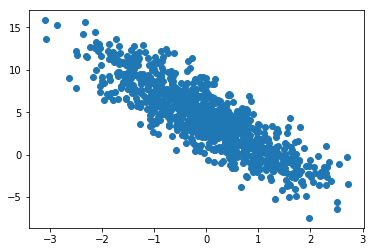

In [42]:
import matplotlib.pyplot as plt
plt.scatter(X[:, 1].asnumpy(),y.asnumpy())
plt.show()

In [43]:
import random
batch_size = 10
def data_iter():
    # 产生一个随机索引
    idx = list(range(num_examples))
    random.shuffle(idx)
    for i in range(0, num_examples, batch_size):
        j = nd.array(idx[i:min(i+batch_size,num_examples)])
        yield nd.take(X, j), nd.take(y, j)

In [44]:
for data, label in data_iter():
    print(data, label)
    break


[[ 0.30164492  1.7506689 ]
 [-0.2878203  -0.17171423]
 [ 0.19235076 -0.02401066]
 [ 0.10879729  1.3366175 ]
 [ 0.06584755 -0.35185757]
 [ 0.5685889   1.7872771 ]
 [ 0.1255492  -0.2172591 ]
 [-0.51551056  1.0048014 ]
 [-0.44407612  0.35991362]
 [-0.5341745  -0.19898641]]
<NDArray 10x2 @cpu(0)> 
[-1.1667111   4.207976    4.647394   -0.13938046  5.5066195  -0.7437447
  5.1907253  -0.24272043  2.0943232   3.8143752 ]
<NDArray 10 @cpu(0)>


In [45]:
w = nd.random_normal(shape=(num_inputs, 1))
b = nd.zeros((1,))
params = [w, b]

In [46]:
w


[[1.1771942]
 [0.7693484]]
<NDArray 2x1 @cpu(0)>

In [47]:
b


[0.]
<NDArray 1 @cpu(0)>

In [48]:
for param in params:
    param.attach_grad()

In [49]:
def net(X):
    return nd.dot(X, w) + b

In [50]:
def square_loss(yhat, y):
    # 注意这里我们把y变形成yhat的形状来避免矩阵形状的自动转换
    return (yhat - y.reshape(yhat.shape)) ** 2

In [51]:
def SGD(params, lr):
    for param in params:
        param[:] = param - lr * param.grad

In [52]:
# 模型函数
def real_fn(X):
    return 2 * X[:, 0] - 3.4 * X[:, 1] + 4.2
# 绘制损失随训练次数降低的折线图，以及预测值和真实值的散点图
def plot(losses, X, sample_size=100):
    xs = list(range(len(losses)))
    f, (fg1, fg2) = plt.subplots(1, 2)
    fg1.set_title('Loss during training')
    fg1.plot(xs, losses, '-r')
    fg2.set_title('Estimated vs real function')
    fg2.plot(X[:sample_size, 1].asnumpy(),
             net(X[:sample_size, :]).asnumpy(), 'or', label='Estimated')
    fg2.plot(X[:sample_size, 1].asnumpy(),
             real_fn(X[:sample_size, :]).asnumpy(), '*g', label='Real')
    fg2.legend()
    plt.show()

Epoch 0, batch 99. Moving avg of loss: 6.754754013155534. Average loss: 8.904795


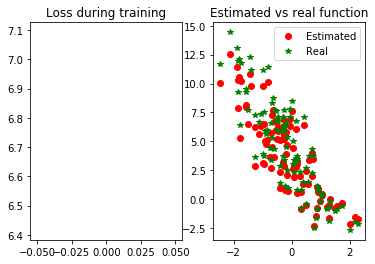

Epoch 1, batch 199. Moving avg of loss: 1.8804565354084093. Average loss: 0.135065


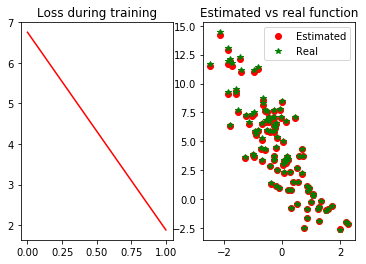

Epoch 2, batch 299. Moving avg of loss: 0.6273379011553414. Average loss: 0.002174


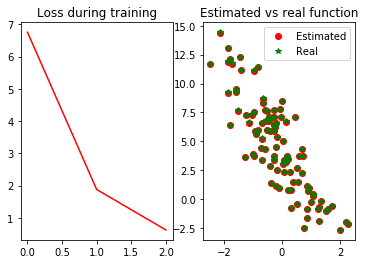

Epoch 3, batch 399. Moving avg of loss: 0.22236821030964668. Average loss: 0.000139


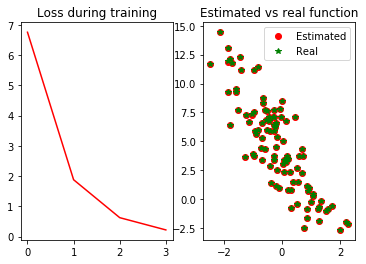

Epoch 4, batch 499. Moving avg of loss: 0.08051958525688296. Average loss: 0.000106


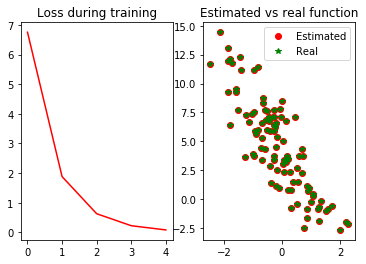

In [53]:
epochs = 5
learning_rate = .001
niter = 0
losses = []
moving_loss = 0
smoothing_constant = .01

# 训练
for e in range(epochs):    
    total_loss = 0

    for data, label in data_iter():
        with autograd.record():
            output = net(data)
            loss = square_loss(output, label)
        loss.backward()
        SGD(params, learning_rate)
        total_loss += nd.sum(loss).asscalar()

        # 记录每读取一个数据点后，损失的移动平均值的变化；
        niter +=1
        curr_loss = nd.mean(loss).asscalar()
        moving_loss = (1 - smoothing_constant) * moving_loss + (smoothing_constant) * curr_loss

        # correct the bias from the moving averages
        est_loss = moving_loss/(1-(1-smoothing_constant)**niter)

        if (niter + 1) % 100 == 0:
            losses.append(est_loss)
            print("Epoch %s, batch %s. Moving avg of loss: %s. Average loss: %f" % (e, niter, est_loss, total_loss/num_examples))
            plot(losses, X)

In [54]:
true_w, w

([2, -3.4], 
 [[ 1.9995818]
  [-3.3998678]]
 <NDArray 2x1 @cpu(0)>)

In [55]:
true_b, b

(4.2, 
 [4.200215]
 <NDArray 1 @cpu(0)>)

In [56]:
from mxnet import ndarray as nd
from mxnet import autograd
from mxnet import gluon

num_inputs = 2
num_examples = 1000

true_w = [2, -3.4]
true_b = 4.2

X = nd.random_normal(shape=(num_examples, num_inputs))
y = true_w[0] * X[:, 0] + true_w[1] * X[:, 1] + true_b
y += .01 * nd.random_normal(shape=y.shape)

In [57]:
batch_size = 10
dataset = gluon.data.ArrayDataset(X, y)
data_iter = gluon.data.DataLoader(dataset, batch_size, shuffle=True)

In [58]:
for data, label in data_iter:
    print(data, label)
    break


[[ 0.9320558   0.7315641 ]
 [-0.13518634 -1.4737916 ]
 [ 0.31229258 -2.1100934 ]
 [ 0.3828762   0.4001854 ]
 [ 0.921104   -0.5204379 ]
 [-1.4120964  -1.5417378 ]
 [ 0.47749522  0.58169323]
 [-1.1711911  -0.6992029 ]
 [ 1.6301289  -0.65481025]
 [-0.3317407   1.1370472 ]]
<NDArray 10x2 @cpu(0)> 
[ 3.5698984   8.936029   12.001068    3.5770707   7.8017216   6.6173944
  3.159635    4.2360563   9.685591   -0.33580595]
<NDArray 10 @cpu(0)>


In [59]:
net = gluon.nn.Sequential()

In [60]:
net.add(gluon.nn.Dense(1))

In [61]:
net

Sequential(
  (0): Dense(None -> 1, linear)
)

In [62]:
net.initialize()

In [63]:
trainer = gluon.Trainer(
    net.collect_params(), 'sgd', {'learning_rate': 0.1})

In [64]:
epochs = 5
batch_size = 10
for e in range(epochs):
    total_loss = 0
    for data, label in data_iter:
        with autograd.record():
            output = net(data)
            loss = square_loss(output, label)
        loss.backward()
        trainer.step(batch_size)
        total_loss += nd.sum(loss).asscalar()
    print("Epoch %d, average loss: %f" % (e, total_loss/num_examples))

Epoch 0, average loss: 0.955537
Epoch 1, average loss: 0.000108
Epoch 2, average loss: 0.000108
Epoch 3, average loss: 0.000110
Epoch 4, average loss: 0.000107


In [65]:
dense = net[0]
true_w, dense.weight.data()

([2, -3.4], 
 [[ 1.9973179 -3.398984 ]]
 <NDArray 1x2 @cpu(0)>)

In [66]:
true_b, dense.bias.data()

(4.2, 
 [4.2004976]
 <NDArray 1 @cpu(0)>)

In [67]:

dense.weight??

Type:        Parameter
String form: Parameter dense0_weight (shape=(1, 2), dtype=float32)
File:        c:\anaconda\lib\site-packages\mxnet\gluon\parameter.py
Source:     
class Parameter(object):
    """A Container holding parameters (weights) of Blocks.

    :py:class:`Parameter` holds a copy of the parameter on each :py:class:`Context` after
    it is initialized with ``Parameter.initialize(...)``. If :py:attr:`grad_req` is
    not ``'null'``, it will also hold a gradient array on each :py:class:`Context`::

        ctx = mx.gpu(0)
        x = mx.nd.zeros((16, 100), ctx=ctx)
        w = mx.gluon.Parameter('fc_weight', shape=(64, 100), init=mx.init.Xavier())
        b = mx.gluon.Parameter('fc_bias', shape=(64,), init=mx.init.Zero())
        w.initialize(ctx=ctx)
        b.initialize(ctx=ctx)
        out = mx.nd.FullyConnected(x, w.data(ctx), b.data(ctx), num_hidden=64)

    Parameters
    ----------
    name : str
        Name of this parameter.
    grad_req : {'write', 'add', 'null'}

In [68]:
from mxnet import gluon
from mxnet import ndarray as nd

def transform(data, label):
    return data.astype('float32')/255, label.astype('float32')
mnist_train = gluon.data.vision.FashionMNIST(train=True, transform=transform)
mnist_test = gluon.data.vision.FashionMNIST(train=False, transform=transform)

In [69]:
data, label = mnist_train[0]
('example shape: ', data.shape, 'label:', label)

('example shape: ', (28, 28, 1), 'label:', 2.0)

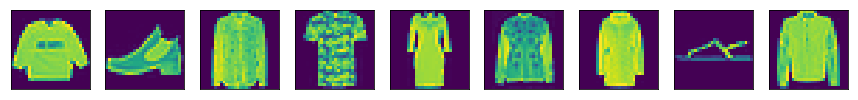

['pullover', 'ankle boot', 'shirt', 't-shirt', 'dress,', 'coat', 'coat', 'sandal', 'coat']


In [70]:
import matplotlib.pyplot as plt

def show_images(images):
    n = images.shape[0]
    _, figs = plt.subplots(1, n, figsize=(15, 15))
    for i in range(n):
        figs[i].imshow(images[i].reshape((28, 28)).asnumpy())
        figs[i].axes.get_xaxis().set_visible(False)
        figs[i].axes.get_yaxis().set_visible(False)
    plt.show()

def get_text_labels(label):
    text_labels = [
        't-shirt', 'trouser', 'pullover', 'dress,', 'coat',
        'sandal', 'shirt', 'sneaker', 'bag', 'ankle boot'
    ]
    return [text_labels[int(i)] for i in label]

data, label = mnist_train[0:9]
show_images(data)
print(get_text_labels(label))

In [71]:
batch_size = 256
train_data = gluon.data.DataLoader(mnist_train, batch_size, shuffle=True)
test_data = gluon.data.DataLoader(mnist_test, batch_size, shuffle=False)

In [72]:
num_inputs = 784
num_outputs = 10

W = nd.random_normal(shape=(num_inputs, num_outputs))
b = nd.random_normal(shape=num_outputs)

params = [W, b]

In [73]:
for param in params:
    param.attach_grad()

In [74]:
from mxnet import nd
def softmax(X):
    exp = nd.exp(X)
    # 假设exp是矩阵，这里对行进行求和，并要求保留axis 1，
    # 就是返回 (nrows, 1) 形状的矩阵
    print(exp)
    partition = exp.sum(axis=1, keepdims=True)
    print(partition)
    return exp / partition

In [75]:
# 示例输入
X = nd.array([[1, 2, 3],
              [4, 5, 6]])

# 应用 softmax 函数
X_prob = softmax(X)

print("Softmax 输出:\n", X_prob)
print("每行和:", X_prob.sum(axis=1))



[[  2.7182817   7.389056   20.085537 ]
 [ 54.59815   148.41316   403.4288   ]]
<NDArray 2x3 @cpu(0)>

[[ 30.192875]
 [606.4401  ]]
<NDArray 2x1 @cpu(0)>
Softmax 输出:
 
[[0.09003057 0.24472848 0.66524094]
 [0.09003057 0.24472846 0.66524094]]
<NDArray 2x3 @cpu(0)>
每行和: 
[1. 1.]
<NDArray 2 @cpu(0)>


In [76]:
X = nd.random_normal(shape=(2,5))
print(X)
X_prob = softmax(X)
print(X_prob)
print(X_prob.sum(axis=1))


[[-0.35326418 -0.8028237   0.03460409 -0.9472166   0.75621986]
 [-0.19965328  0.40891454 -1.2352461  -1.2138575   0.1691662 ]]
<NDArray 2x5 @cpu(0)>

[[0.7023916  0.44806197 1.0352098  0.387819   2.1302085 ]
 [0.81901467 1.5051831  0.2907632  0.2970492  1.184317  ]]
<NDArray 2x5 @cpu(0)>

[[4.7036905]
 [4.0963273]]
<NDArray 2x1 @cpu(0)>

[[0.14932777 0.09525754 0.22008458 0.08244994 0.45288023]
 [0.19993877 0.367447   0.07098144 0.07251598 0.2891168 ]]
<NDArray 2x5 @cpu(0)>

[1. 1.]
<NDArray 2 @cpu(0)>


In [77]:
def net(X):
    return softmax(nd.dot(X.reshape((-1,num_inputs)), W) + b)

In [78]:
def cross_entropy(yhat, y):
    return - nd.pick(nd.log(yhat), y)

In [79]:
def accuracy(output, label):
    return nd.mean(output.argmax(axis=1)==label).asscalar()

In [80]:
def evaluate_accuracy(data_iterator, net):
    acc = 0.
    for data, label in data_iterator:
        output = net(data)
        acc += accuracy(output, label)
    return acc / len(data_iterator)

In [81]:
evaluate_accuracy(test_data, net)


[[3.0128058e-04 3.0485168e-01 1.3301674e+07 ... 4.1401050e+02
  5.8500177e-16 5.8984509e+02]
 [7.9940100e+02 3.6815973e+02 4.3220911e-02 ... 4.6575346e+00
  4.7679301e-08 5.2382440e+02]
 [6.0504899e-06 2.2282531e-02 5.9456685e+03 ... 5.7353145e-01
  1.7196500e-06 2.2417250e+00]
 ...
 [5.5469930e-13 9.2495326e-04 1.1783707e+05 ... 2.8691026e-03
  4.7126615e-19 1.8202734e+03]
 [7.0227627e-17 3.2149957e-05 3.7946045e+06 ... 7.6970540e-04
  5.2987142e-17 9.9745654e+02]
 [4.1367663e-11 9.7482307e+01 2.1033294e+09 ... 2.4942702e-01
  2.7392765e-12 1.6688633e+03]]
<NDArray 256x10 @cpu(0)>

[[1.33029220e+07]
 [2.58572928e+08]
 [5.94869482e+03]
 [3.08969940e+02]
 [6.53536328e+03]
 [5.68419228e+01]
 [2.40513275e+06]
 [5.94181152e+03]
 [3.20912832e+08]
 [2.59240601e+03]
 [2.73587311e+02]
 [1.97285187e+02]
 [3.60950040e+07]
 [2.18524512e+04]
 [3.84053101e+02]
 [4.78504000e+06]
 [6.48096062e+05]
 [1.10493730e+04]
 [2.59547900e+07]
 [7.07069855e+01]
 [3.44408375e+05]
 [3.03040344e+05]
 [2.93724062e



[[1.70370594e+05]
 [1.22798828e+04]
 [1.90481138e+11]
 [1.29552900e+11]
 [2.03056148e+10]
 [1.80875391e+05]
 [6.94686080e+07]
 [1.98140300e+06]
 [2.10091675e+02]
 [3.65945225e+06]
 [1.16695388e+06]
 [3.03546600e+02]
 [3.96243652e+02]
 [1.44412764e+04]
 [7.23288480e+07]
 [6.25347875e+05]
 [1.51477660e+07]
 [8.31972852e+03]
 [2.72199158e+02]
 [1.82744395e+04]
 [3.22534825e+06]
 [1.91028284e+03]
 [6.38484062e+05]
 [4.10029219e+05]
 [4.41688828e+04]
 [4.12965300e+12]
 [1.55554253e+10]
 [3.82641280e+07]
 [4.75168850e+06]
 [2.20141846e+03]
 [7.84246477e+09]
 [3.93465984e+09]
 [1.47735550e+02]
 [5.57419450e+06]
 [7.05637850e+06]
 [6.84700098e+03]
 [7.06109747e+09]
 [6.43935800e+07]
 [4.99124768e+08]
 [9.56180391e+04]
 [7.93155440e+07]
 [4.04825630e+01]
 [3.06475220e+03]
 [1.77525500e+05]
 [8.92338257e+01]
 [8.41932266e+04]
 [2.11602900e+07]
 [2.02607662e+06]
 [9.63090200e+06]
 [7.75873152e+08]
 [1.65089490e+07]
 [1.01118694e+09]
 [1.87370377e+02]
 [6.66480500e+06]
 [1.03572990e+07]
 [7.4597

0.1216796875

In [82]:
import sys
sys.path.append('..')
from mxnet import autograd
def SGD(params, lr):
    for param in params:
        param[:] = param - lr * param.grad
learning_rate = .1

for epoch in range(5):
    train_loss = 0.
    train_acc = 0.
    for data, label in train_data:
        with autograd.record():
            output = net(data)
            loss = cross_entropy(output, label)
        loss.backward()
        # 将梯度做平均，这样学习率会对batch size不那么敏感
        SGD(params, learning_rate/batch_size)

        train_loss += nd.mean(loss).asscalar()
        train_acc += accuracy(output, label)

    test_acc = evaluate_accuracy(test_data, net)
    print("Epoch %d. Loss: %f, Train acc %f, Test acc %f" % (
        epoch, train_loss/len(train_data), train_acc/len(train_data), test_acc))


[[2.5545582e-08 4.4348393e-02 1.4695222e+01 ... 1.3190166e+01
  1.3800518e-03 4.1599922e-02]
 [1.1480091e-11 5.2072924e-01 2.2230579e+08 ... 7.4049694e-06
  3.2066058e-18 7.0383759e+01]
 [3.2202885e-09 3.8405281e-02 1.3108114e+01 ... 2.5003667e+00
  9.7799745e-14 5.4654621e+01]
 ...
 [7.0335007e+01 3.6215518e-02 1.1087338e+00 ... 2.2253163e-02
  2.6608679e-05 1.9334019e+01]
 [7.2916362e-07 1.0393853e-02 2.0001411e+00 ... 7.7305845e-04
  9.0170829e-03 5.4547278e+02]
 [1.2938825e-03 2.8550510e+01 6.8451062e+02 ... 5.2148417e-02
  1.3713970e-08 6.0926390e-01]]
<NDArray 256x10 @cpu(0)>



[[1.56390161e+03]
 [2.22920208e+08]
 [5.10618973e+12]
 [2.99805875e+06]
 [6.85055520e+07]
 [9.54812500e+04]
 [2.02124360e+07]
 [9.68332910e+03]
 [1.10227400e+07]
 [6.54689690e+09]
 [6.57779590e+03]
 [2.23839902e+04]
 [3.10902075e+06]
 [8.17980078e+03]
 [1.31809802e+03]
 [2.83354500e+05]
 [7.67386320e+07]
 [4.93816589e+02]
 [4.90038040e+07]
 [1.31701406e+05]
 [2.97038438e+05]
 [1.48797219e+05]
 [4.76811816e+03]
 [3.33518047e+04]
 [4.12357674e+01]
 [1.28496540e+12]
 [4.01361188e+05]
 [9.52299297e+04]
 [1.00995879e+04]
 [7.28322031e+04]
 [8.50062734e+04]
 [2.07891825e+06]
 [2.15626895e+04]
 [3.92495488e+08]
 [3.90349184e+08]
 [2.92965800e+06]
 [4.92041680e+04]
 [1.46286602e+01]
 [2.81299248e+01]
 [5.83300672e+08]
 [6.84792960e+07]
 [6.50091095e+01]
 [1.34248828e+05]
 [2.64882075e+06]
 [1.10030539e+05]
 [3.60203979e+03]
 [1.67903296e+09]
 [1.99575456e+08]
 [6.51929812e+05]
 [1.39518781e+05]
 [3.17861531e+05]
 [7.32969938e+05]
 [1.41853810e+07]
 [2.11658586e+09]
 [6.75308544e+08]
 [3.69535

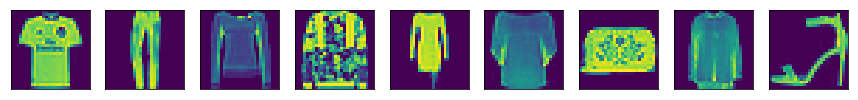

true labels
['t-shirt', 'trouser', 'pullover', 'pullover', 'dress,', 'pullover', 'bag', 'shirt', 'sandal']

[[1.7392643e+04 4.1608009e-06 1.7051288e+00 4.5902838e-04 1.8232717e-03
  2.4029192e-11 4.9765645e+03 7.9180187e-12 1.0310597e-02 7.6896528e-10]
 [9.5430613e+00 1.5871926e+10 2.5033775e-01 1.5771952e+03 4.6369556e-01
  6.3582554e-08 1.8630208e-02 2.2175591e-05 1.9839246e-07 6.4933673e-05]
 [7.2158850e-04 1.4707635e-03 4.0456924e+02 3.3863226e-04 3.9600277e-01
  5.8877491e-04 2.3541829e-02 2.8890761e-06 7.7450844e-05 1.6997322e-04]
 [2.3258469e+00 9.4381580e-04 7.1563451e-03 3.9528209e-06 9.2266135e-02
  1.0344540e-09 2.4078763e+02 2.1144389e-10 8.0075784e-05 2.1374229e-09]
 [1.9019121e+01 2.2493261e-03 1.6513424e-01 2.0517585e+00 3.5035300e-01
  3.8070409e-09 1.1785958e-04 1.0679300e-06 2.2819322e-04 6.6722870e-11]
 [1.1590736e-01 3.2506092e-04 1.3731228e-02 1.8186030e-03 1.8523987e-01
  2.3918083e-05 9.8095005e-03 2.5165252e-06 3.6160448e+00 4.8368634e-09]
 [2.1474798e-05 5.1416

In [83]:
data, label = mnist_test[0:9]
show_images(data)
print('true labels')
print(get_text_labels(label))

predicted_labels = net(data).argmax(axis=1)
print('predicted labels')
print(get_text_labels(predicted_labels.asnumpy()))

In [84]:
import utils
import sys
sys.path.append('..')
from mxnet import autograd
learning_rate = .09

for epoch in range(5):
    train_loss = 0.
    train_acc = 0.
    for data, label in train_data:
        with autograd.record():
            output = net(data)
            loss = cross_entropy(output, label)
        loss.backward()
        # 将梯度做平均，这样学习率会对batch size不那么敏感
        SGD(params, learning_rate/batch_size)

        train_loss += nd.mean(loss).asscalar()
        train_acc += accuracy(output, label)

    test_acc = evaluate_accuracy(test_data, net)
    print("Epoch %d. Loss: %f, Train acc %f, Test acc %f" % (
        epoch, train_loss/len(train_data), train_acc/len(train_data), test_acc))


[[4.25654389e-06 1.12647181e-02 4.87509705e-02 ... 8.55771729e+02
  9.76408366e-03 1.50019062e+00]
 [1.10007164e-07 1.13082557e-07 1.07992435e+00 ... 1.23942909e-08
  8.01461101e-06 3.38177486e-08]
 [4.56132945e-08 3.43273257e-11 4.95714275e-03 ... 2.69607781e+05
  1.35683078e+05 2.54818586e+09]
 ...
 [4.43936624e-02 2.02097441e-03 4.53377962e+00 ... 5.95435722e-06
  1.32938119e-04 1.15417102e-07]
 [7.35456779e-05 2.67271425e-05 2.78740644e-01 ... 1.30700172e-07
  8.49215031e+00 9.56201264e-13]
 [3.43398060e-05 2.56594012e-05 3.16232763e-05 ... 2.83060723e+04
  2.28886771e+00 8.94726515e-01]]
<NDArray 256x10 @cpu(0)>

[[8.80042908e+02]
 [1.52302408e+00]
 [2.54873293e+09]
 [5.23716271e-01]
 [5.20044804e+00]
 [2.35957781e+05]
 [7.93590312e+04]
 [2.32490501e+01]
 [3.78213644e-01]
 [1.04511855e+04]
 [1.34433029e+02]
 [2.68878235e+02]
 [3.96564980e+01]
 [1.35852910e+04]
 [8.12869141e+04]
 [1.33359492e+04]
 [1.22274850e+06]
 [1.31467402e+00]
 [1.45621170e+02]
 [1.16235741e+02]
 [1.56588422e

In [120]:
import sys
sys.path.append('..')
import utils
batch_size = 256
train_data, test_data = utils.load_data_fashion_mnist(batch_size)

In [126]:
from mxnet import ndarray as nd

num_inputs = 28*28
num_outputs = 10

num_hidden = 256*2
weight_scale = .01

W1 = nd.random_normal(shape=(num_inputs, num_hidden), scale=weight_scale)
b1 = nd.zeros(num_hidden)

W2 = nd.random_normal(shape=(num_hidden, num_outputs), scale=weight_scale)
b2 = nd.zeros(num_outputs)

params = [W1, b1, W2, b2]

for param in params:
    param.attach_grad()

In [122]:
def relu(X):
    return nd.maximum(X, 0)

In [123]:
def net(X):
    X = X.reshape((-1, num_inputs))
    h1 = relu(nd.dot(X, W1) + b1)
    output = nd.dot(h1, W2) + b2
    return output

In [124]:
from mxnet import gluon
softmax_cross_entropy = gluon.loss.SoftmaxCrossEntropyLoss()

In [127]:
from mxnet import autograd as autograd

learning_rate = .05

for epoch in range(5):
    train_loss = 0.
    train_acc = 0.
    for data, label in train_data:
        with autograd.record():
            output = net(data)
            loss = softmax_cross_entropy(output, label)
        loss.backward()
        utils.SGD(params, learning_rate/batch_size)

        train_loss += nd.mean(loss).asscalar()
        train_acc += utils.accuracy(output, label)

    test_acc = utils.evaluate_accuracy(test_data, net)
    print("Epoch %d. Loss: %f, Train acc %f, Test acc %f" % (
        epoch, train_loss/len(train_data),
        train_acc/len(train_data), test_acc))

Epoch 0. Loss: 1.251218, Train acc 0.603032, Test acc 0.707632
Epoch 1. Loss: 0.695481, Train acc 0.754107, Test acc 0.779046
Epoch 2. Loss: 0.590431, Train acc 0.795974, Test acc 0.809395
Epoch 3. Loss: 0.537557, Train acc 0.814937, Test acc 0.810797
Epoch 4. Loss: 0.509213, Train acc 0.823067, Test acc 0.824419


In [132]:
from mxnet import gluon

net = gluon.nn.Sequential()
with net.name_scope():
    net.add(gluon.nn.Flatten())
    net.add(gluon.nn.Dense(256, activation="relu"))
    net.add(gluon.nn.Dense(10))
net.initialize()

In [133]:
import sys
sys.path.append('..')
from mxnet import ndarray as nd
from mxnet import autograd
import utils


batch_size = 256
train_data, test_data = utils.load_data_fashion_mnist(batch_size)

softmax_cross_entropy = gluon.loss.SoftmaxCrossEntropyLoss()
trainer = gluon.Trainer(net.collect_params(), 'sgd', {'learning_rate': 0.5})

for epoch in range(5):
    train_loss = 0.
    train_acc = 0.
    for data, label in train_data:
        with autograd.record():
            output = net(data)
            loss = softmax_cross_entropy(output, label)
        loss.backward()
        trainer.step(batch_size)

        train_loss += nd.mean(loss).asscalar()
        train_acc += utils.accuracy(output, label)

    test_acc = utils.evaluate_accuracy(test_data, net)
    print("Epoch %d. Loss: %f, Train acc %f, Test acc %f" % (
        epoch, train_loss/len(train_data), train_acc/len(train_data), test_acc))

Epoch 0. Loss: 0.739075, Train acc 0.728699, Test acc 0.833033
Epoch 1. Loss: 0.487875, Train acc 0.819161, Test acc 0.801482
Epoch 2. Loss: 0.418393, Train acc 0.846271, Test acc 0.859275
Epoch 3. Loss: 0.385046, Train acc 0.857105, Test acc 0.864383
Epoch 4. Loss: 0.362381, Train acc 0.866587, Test acc 0.870793


In [146]:
from mxnet import ndarray as nd
from mxnet import autograd
from mxnet import gluon

num_train = 100
num_test = 100
true_w = [1.2, -3.4, 5.6]
true_b = 5.0

In [159]:
x = nd.random.normal(shape=(num_train + num_test, 1))
X = nd.concat(x, nd.power(x, 2), nd.power(x, 3))
y = true_w[0] * X[:, 0] + true_w[1] * X[:, 1] + true_w[2] * X[:, 2] + true_b
y += .1 * nd.random.normal(shape=y.shape)

('x:', x[:5], 'X:', X[0:5,2], 'y:', y[:5])

('x:', 
 [[ 1.4610001 ]
  [ 1.0166402 ]
  [-1.8160155 ]
  [ 0.09338771]
  [-0.9047391 ]]
 <NDArray 5x1 @cpu(0)>, 'X:', 
 [ 3.1185358e+00  1.0507559e+00 -5.9890594e+00  8.1445888e-04
  -7.4057674e-01]
 <NDArray 5 @cpu(0)>, 'y:', 
 [ 16.907427    8.322694  -41.782303    4.9848714  -2.944737 ]
 <NDArray 5 @cpu(0)>)

In [137]:
%matplotlib inline
import matplotlib as mpl
mpl.rcParams['figure.dpi']= 120
import matplotlib.pyplot as plt

def train(X_train, X_test, y_train, y_test):
    # 线性回归模型
    net = gluon.nn.Sequential()
    with net.name_scope():
        net.add(gluon.nn.Dense(1))
    net.initialize()
    # 设一些默认参数
    learning_rate = 0.01
    epochs = 100
    batch_size = min(10, y_train.shape[0])
    dataset_train = gluon.data.ArrayDataset(X_train, y_train)
    data_iter_train = gluon.data.DataLoader(
        dataset_train, batch_size, shuffle=True)
    # 默认SGD和均方误差
    trainer = gluon.Trainer(net.collect_params(), 'sgd', {
        'learning_rate': learning_rate})
    square_loss = gluon.loss.L2Loss()
    # 保存训练和测试损失
    train_loss = []
    test_loss = []
    for e in range(epochs):
        for data, label in data_iter_train:
            with autograd.record():
                output = net(data)
                loss = square_loss(output, label)
            loss.backward()
            trainer.step(batch_size)
        train_loss.append(square_loss(
            net(X_train), y_train).mean().asscalar())
        test_loss.append(square_loss(
            net(X_test), y_test).mean().asscalar())
    # 打印结果    
    plt.plot(train_loss)
    plt.plot(test_loss)
    plt.legend(['train','test'])
    plt.show()
    return ('learned weight', net[0].weight.data(), 
            'learned bias', net[0].bias.data())

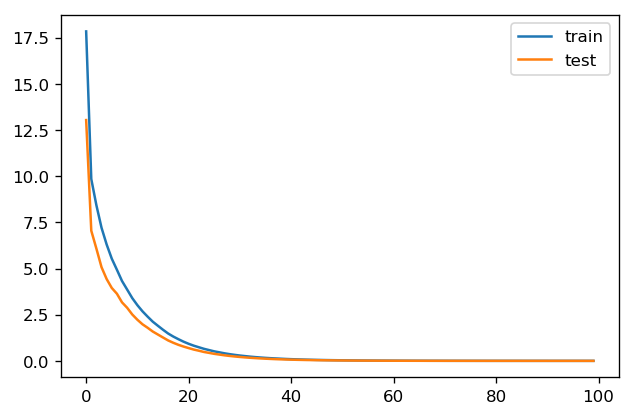

('learned weight', 
 [[ 1.2253313 -3.3919218  5.5951977]]
 <NDArray 1x3 @cpu(0)>, 'learned bias', 
 [4.993457]
 <NDArray 1 @cpu(0)>)

In [138]:
train(X[:num_train, :], X[num_train:, :], y[:num_train], y[num_train:])

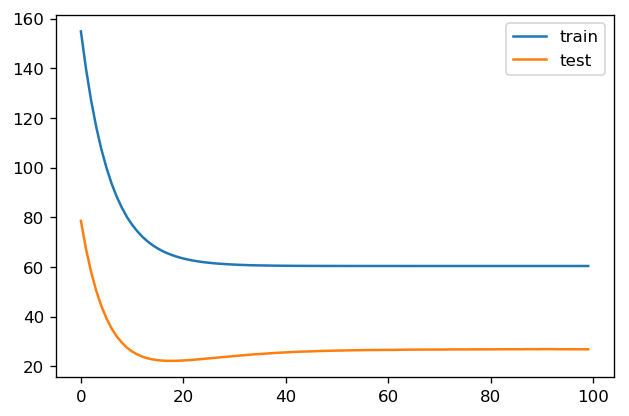

('learned weight', 
 [[15.948693]]
 <NDArray 1x1 @cpu(0)>, 'learned bias', 
 [2.2937748]
 <NDArray 1 @cpu(0)>)

In [139]:
train(x[:num_train, :], x[num_train:, :], y[:num_train], y[num_train:])

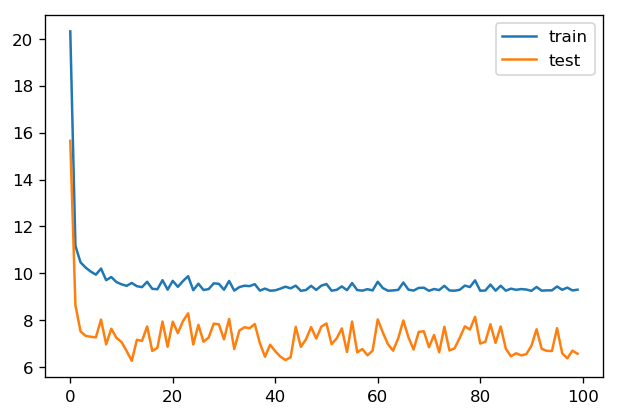

('learned weight', 
 [[5.662813]]
 <NDArray 1x1 @cpu(0)>, 'learned bias', 
 [2.1890502]
 <NDArray 1 @cpu(0)>)

In [141]:
train(X[:num_train, 2], X[num_train:, 2], y[:num_train], y[num_train:])

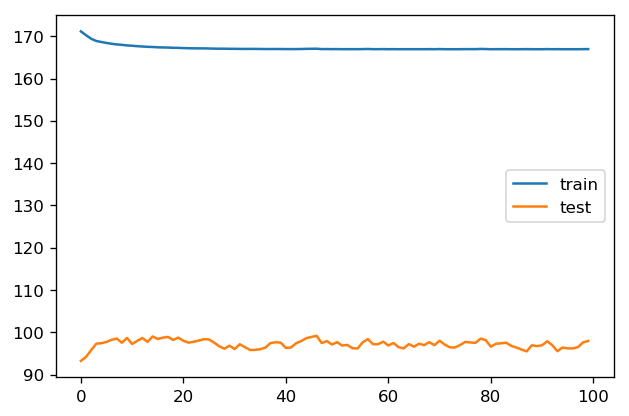

('learned weight', 
 [[0.12696996]]
 <NDArray 1x1 @cpu(0)>, 'learned bias', 
 [3.3863072]
 <NDArray 1 @cpu(0)>)

In [143]:
train(X[:num_train, 1], X[num_train:, 1], y[:num_train], y[num_train:])

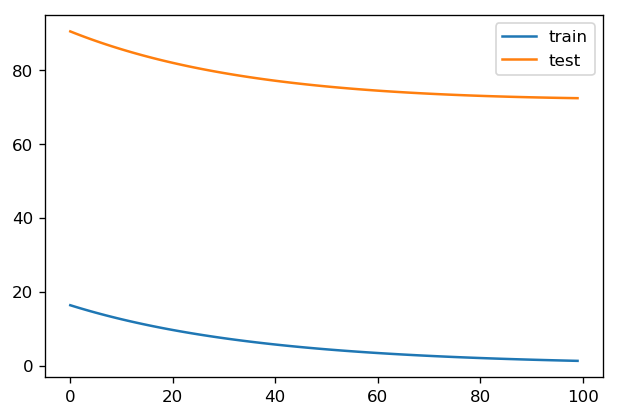

('learned weight', 
 [[1.1068771  1.1186337  0.87696505]]
 <NDArray 1x3 @cpu(0)>, 'learned bias', 
 [3.2224247]
 <NDArray 1 @cpu(0)>)

In [140]:
train(X[0:2, :], X[num_train:, :], y[0:2], y[num_train:])

显然我们发现的是对于过拟合是因为数据集不够导致过度拟合训练数据的情况但是欠拟合那就是拟合的模型的复杂度不够导致的无法很好的拟合数据集